## Masked Autoencoders: Visualization Demo

This is a visualization demo using our pre-trained MAE models. No GPU is needed.

### Prepare
Check environment. Install packages if in Colab.


In [1]:
import sys
import os
import natsort
import requests

import torch
import numpy as np

import matplotlib.pyplot as plt
from PIL import Image

# check whether run in Colab
if 'google.colab' in sys.modules:
    print('Running in Colab.')
    !pip3 install timm==0.4.5  # 0.3.2 does not work in Colab
    !git clone https://github.com/facebookresearch/mae.git
    sys.path.append('./mae')
else:
    sys.path.append('..')
import models_mae

/home/siddiqui/anaconda3/lib/python3.9/site-packages/apex/pyprof/__init__.py:5: FutureWarning: pyprof will be removed by the end of June, 2022
  warnings.warn("pyprof will be removed by the end of June, 2022", FutureWarning)


### Define utils

In [2]:
# define the utils

imagenet_mean = np.array([0.485, 0.456, 0.406])
imagenet_std = np.array([0.229, 0.224, 0.225])

def show_image(image, title=''):
    # image is [H, W, 3]
    assert image.shape[2] == 3
    plt.imshow(torch.clip((image * imagenet_std + imagenet_mean) * 255, 0, 255).int())
    plt.title(title, fontsize=16)
    plt.axis('off')
    return

def prepare_model(chkpt_dir, arch='mae_vit_large_patch16'):
    # build model
    model = getattr(models_mae, arch)()
    # load model
    checkpoint = torch.load(chkpt_dir, map_location='cpu')
    msg = model.load_state_dict(checkpoint['model'], strict=False)
    print(msg)
    return model

def run_one_image(img, model, second_model=None, output_file=None):
    x = torch.tensor(img)

    # make it a batch-like
    x = x.unsqueeze(dim=0)
    x = torch.einsum('nhwc->nchw', x)

    # run MAE
    loss, y, mask = model(x.float(), mask_ratio=0.75)
    
    y = model.unpatchify(y)
    y = torch.einsum('nchw->nhwc', y).detach().cpu()

    # visualize the mask
    mask = mask.detach()
    mask = mask.unsqueeze(-1).repeat(1, 1, model.patch_embed.patch_size[0]**2 *3)  # (N, H*W, p*p*3)
    mask = model.unpatchify(mask)  # 1 is removing, 0 is keeping
    mask = torch.einsum('nchw->nhwc', mask).detach().cpu()
    
    if second_model is not None:
        loss_second, y_second, mask_second = second_model(x.float(), mask_ratio=0.75)
        
        y_second = second_model.unpatchify(y_second)
        y_second = torch.einsum('nchw->nhwc', y_second).detach().cpu()

        # visualize the mask
        mask_second = mask_second.detach()
        mask_second = mask_second.unsqueeze(-1).repeat(1, 1, second_model.patch_embed.patch_size[0]**2 *3)  # (N, H*W, p*p*3)
        mask_second = second_model.unpatchify(mask_second)  # 1 is removing, 0 is keeping
        mask_second = torch.einsum('nchw->nhwc', mask_second).detach().cpu()
    
    x = torch.einsum('nchw->nhwc', x)
    
    # masked image
    im_masked = x * (1 - mask)

    # MAE reconstruction pasted with visible patches
    im_paste = x * (1 - mask) + y * mask
    
    # make the plt figure larger
    total_plots = 4 if second_model is None else 6
    plt.rcParams['figure.figsize'] = [6 * total_plots, 6.5]

    plt.subplot(1, total_plots, 1)
    show_image(x[0], "original")

    plt.subplot(1, total_plots, 2)
    show_image(im_masked[0], "masked")

    plt.subplot(1, total_plots, 3)
    show_image(y[0], "reconstruction")

    plt.subplot(1, total_plots, 4)
    show_image(im_paste[0], "reconstruction + visible")
    
    if second_model is not None:
        # MAE reconstruction pasted with visible patches
        im_paste_second = x * (1 - mask_second) + y_second * mask_second
        
        plt.subplot(1, total_plots, 5)
        show_image(y_second[0], "GAN loss (reconstruction)")
        
        plt.subplot(1, total_plots, 6)
        show_image(im_paste_second[0], "GAN loss (reconstruction + visible)")

    plt.tight_layout()
    if output_file is not None:
        plt.savefig(output_file, dpi=300)
    plt.show()

### Load an image

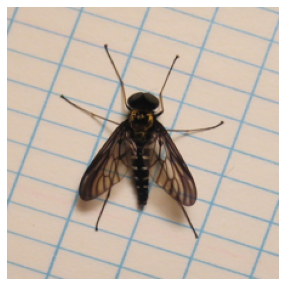

In [3]:
# load an image
img_url = 'https://user-images.githubusercontent.com/11435359/147738734-196fd92f-9260-48d5-ba7e-bf103d29364d.jpg' # fox, from ILSVRC2012_val_00046145
# img_url = 'https://user-images.githubusercontent.com/11435359/147743081-0428eecf-89e5-4e07-8da5-a30fd73cc0ba.jpg' # cucumber, from ILSVRC2012_val_00047851
# img = Image.open(requests.get(img_url, stream=True).raw)

# img_path = "/mnt/sas/Datasets/anomalous_species/species/fungi/abortiporus_biennis/1043798.jpg"  # 
img_path = "/mnt/sas/Datasets/anomalous_species/species/insects/chrysopilus_thoracicus/531211.jpg" # Insect
img = Image.open(img_path)

img = img.resize((224, 224))
img = np.array(img) / 255.

assert img.shape == (224, 224, 3)

# normalize by ImageNet mean and std
img = img - imagenet_mean
img = img / imagenet_std

plt.rcParams['figure.figsize'] = [5, 5]
show_image(torch.tensor(img))

### Load a pre-trained MAE model

In [4]:
# This is an MAE model trained with pixels as targets for visualization (ViT-Large, training mask ratio=0.75)

# download checkpoint if not exist
!wget -nc https://dl.fbaipublicfiles.com/mae/visualize/mae_visualize_vit_large.pth

chkpt_dir = 'mae_visualize_vit_large.pth'
model_mae = prepare_model(chkpt_dir, 'mae_vit_large_patch16')
print('Model loaded.')


File ‘mae_visualize_vit_large.pth’ already there; not retrieving.

<All keys matched successfully>
Model loaded.


### Run MAE on the image

MAE with pixel reconstruction:


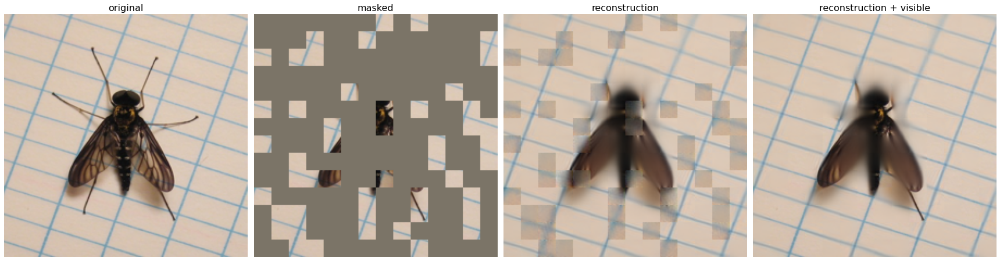

In [5]:
# make random mask reproducible (comment out to make it change)
torch.manual_seed(2)
print('MAE with pixel reconstruction:')
run_one_image(img, model_mae)

### Load another pre-trained MAE model

In [6]:
# This is an MAE model trained with an extra GAN loss for more realistic generation (ViT-Large, training mask ratio=0.75)

# download checkpoint if not exist
!wget -nc https://dl.fbaipublicfiles.com/mae/visualize/mae_visualize_vit_large_ganloss.pth

chkpt_dir = 'mae_visualize_vit_large_ganloss.pth'
model_mae_gan = prepare_model('mae_visualize_vit_large_ganloss.pth', 'mae_vit_large_patch16')
print('Model loaded.')

File ‘mae_visualize_vit_large_ganloss.pth’ already there; not retrieving.

<All keys matched successfully>
Model loaded.


### Run MAE on the image

MAE with extra GAN loss:


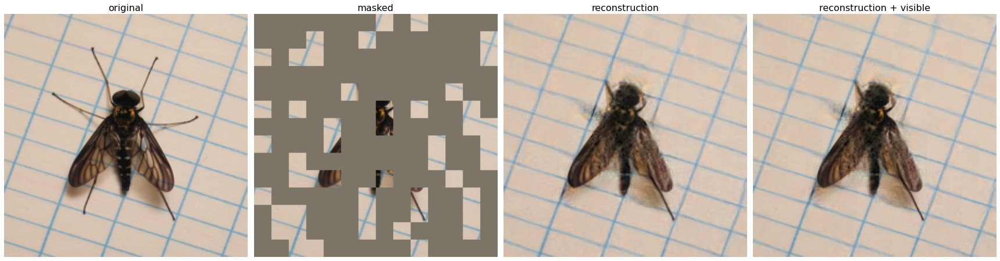

In [7]:
# make random mask reproducible (comment out to make it change)
torch.manual_seed(2)
print('MAE with extra GAN loss:')
run_one_image(img, model_mae_gan)

## Load all the images

In [8]:
image_dir = "/home/siddiqui/Documents/interesting_pictures/"
files = natsort.natsorted([os.path.join(image_dir, x) for x in os.listdir(image_dir)])
print(files)

['/home/siddiqui/Documents/interesting_pictures/beach.jpg', '/home/siddiqui/Documents/interesting_pictures/building.jpg', '/home/siddiqui/Documents/interesting_pictures/cambridge.jpg', '/home/siddiqui/Documents/interesting_pictures/cambridge_mosque.jpg', '/home/siddiqui/Documents/interesting_pictures/castle.jpg', '/home/siddiqui/Documents/interesting_pictures/cat_guy.jpg', '/home/siddiqui/Documents/interesting_pictures/great_hall.jpg', '/home/siddiqui/Documents/interesting_pictures/horse_face.jpg', '/home/siddiqui/Documents/interesting_pictures/horse_riders.jpg', '/home/siddiqui/Documents/interesting_pictures/kitkat.jpg', '/home/siddiqui/Documents/interesting_pictures/panda.jpg', '/home/siddiqui/Documents/interesting_pictures/pool.jpg', '/home/siddiqui/Documents/interesting_pictures/pope.jpg', '/home/siddiqui/Documents/interesting_pictures/rhino.jpg', '/home/siddiqui/Documents/interesting_pictures/rugby.jpg', '/home/siddiqui/Documents/interesting_pictures/strange_car.jpg', '/home/siddi

loading file: /home/siddiqui/Documents/interesting_pictures/beach.jpg
MAE with pixel reconstruction:


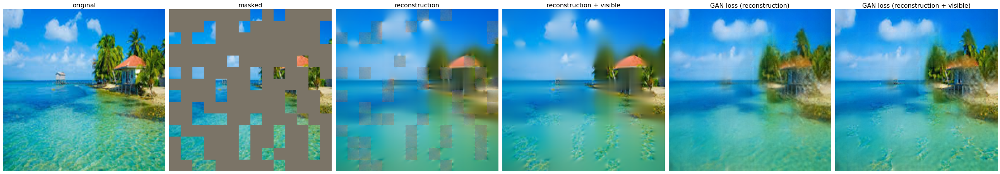

loading file: /home/siddiqui/Documents/interesting_pictures/building.jpg
MAE with pixel reconstruction:


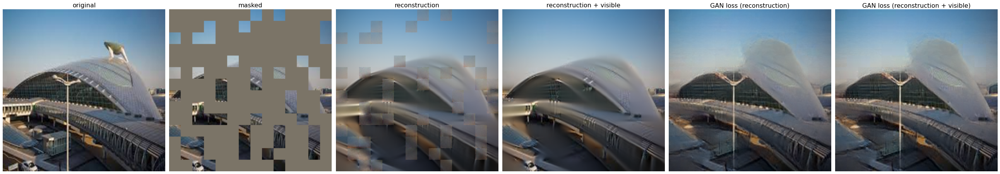

loading file: /home/siddiqui/Documents/interesting_pictures/cambridge.jpg
MAE with pixel reconstruction:


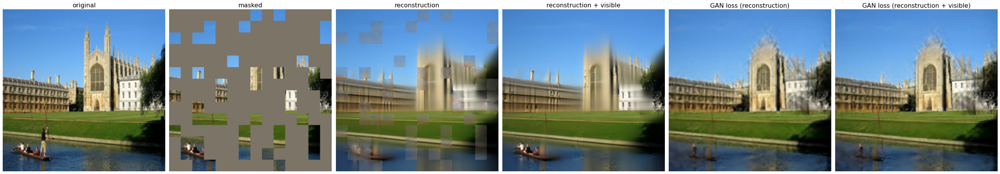

loading file: /home/siddiqui/Documents/interesting_pictures/cambridge_mosque.jpg
MAE with pixel reconstruction:


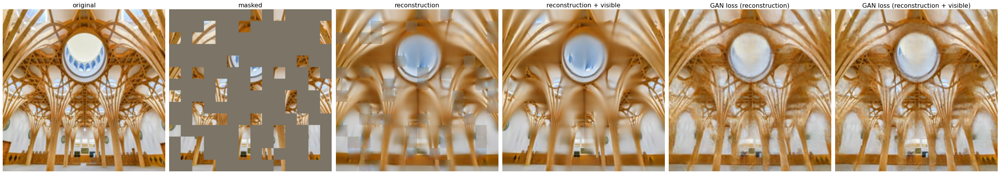

loading file: /home/siddiqui/Documents/interesting_pictures/castle.jpg
MAE with pixel reconstruction:


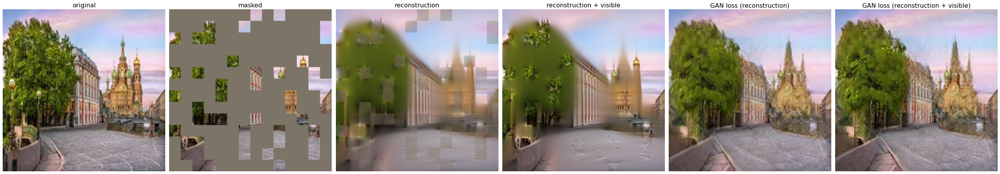

loading file: /home/siddiqui/Documents/interesting_pictures/cat_guy.jpg
MAE with pixel reconstruction:


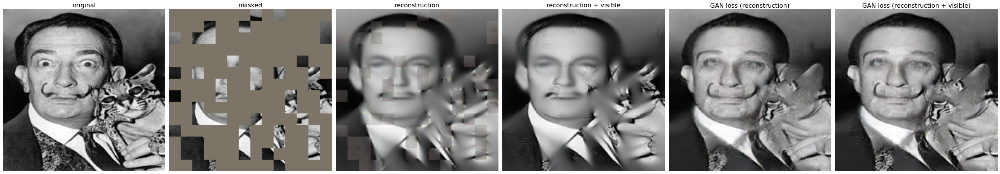

loading file: /home/siddiqui/Documents/interesting_pictures/great_hall.jpg
MAE with pixel reconstruction:


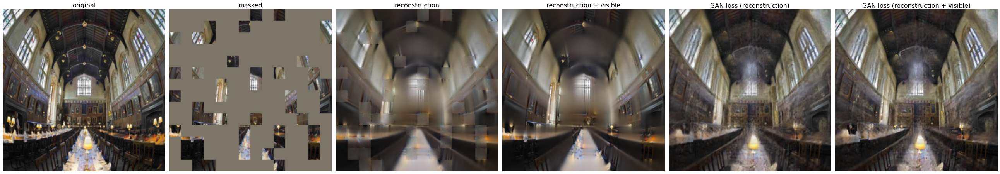

loading file: /home/siddiqui/Documents/interesting_pictures/horse_face.jpg
MAE with pixel reconstruction:


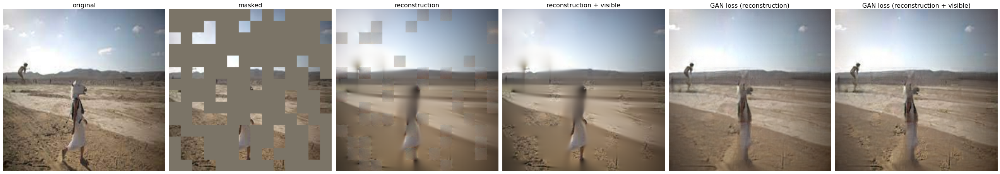

loading file: /home/siddiqui/Documents/interesting_pictures/horse_riders.jpg
MAE with pixel reconstruction:


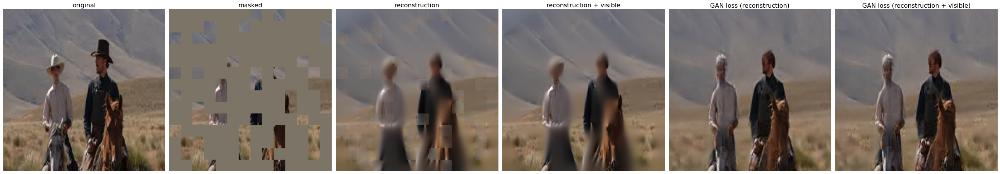

loading file: /home/siddiqui/Documents/interesting_pictures/kitkat.jpg
MAE with pixel reconstruction:


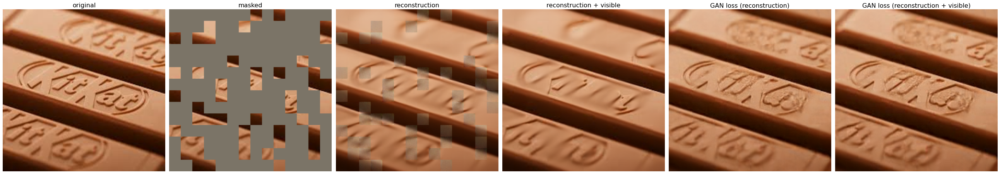

loading file: /home/siddiqui/Documents/interesting_pictures/panda.jpg
MAE with pixel reconstruction:


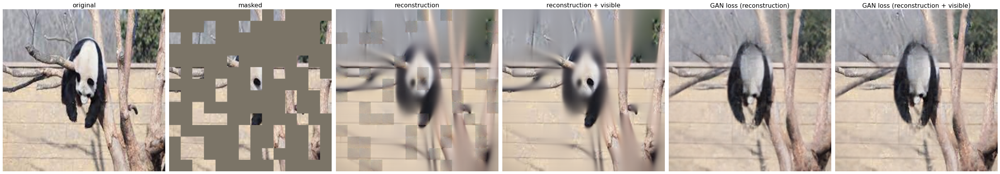

loading file: /home/siddiqui/Documents/interesting_pictures/pool.jpg
MAE with pixel reconstruction:


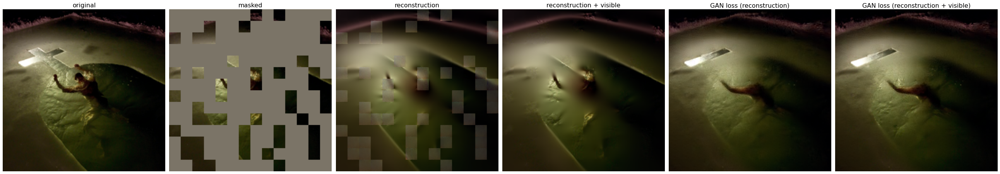

loading file: /home/siddiqui/Documents/interesting_pictures/pope.jpg
MAE with pixel reconstruction:


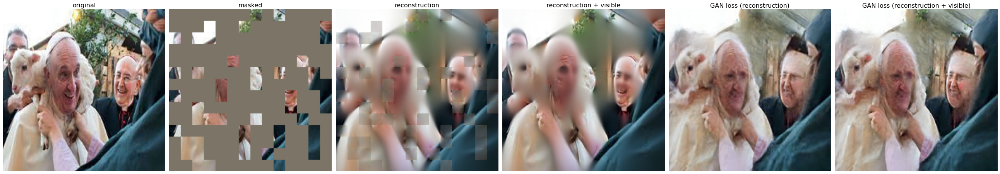

loading file: /home/siddiqui/Documents/interesting_pictures/rhino.jpg
MAE with pixel reconstruction:


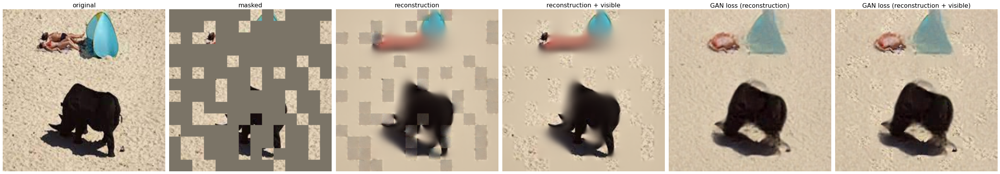

loading file: /home/siddiqui/Documents/interesting_pictures/rugby.jpg
MAE with pixel reconstruction:


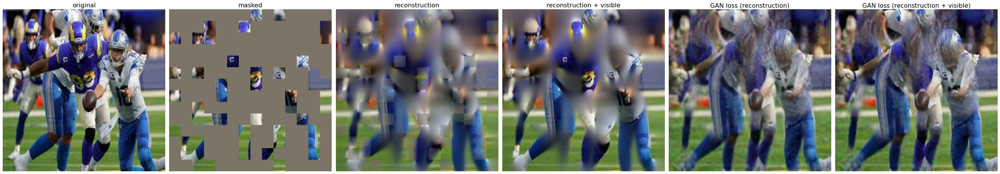

loading file: /home/siddiqui/Documents/interesting_pictures/strange_car.jpg
MAE with pixel reconstruction:


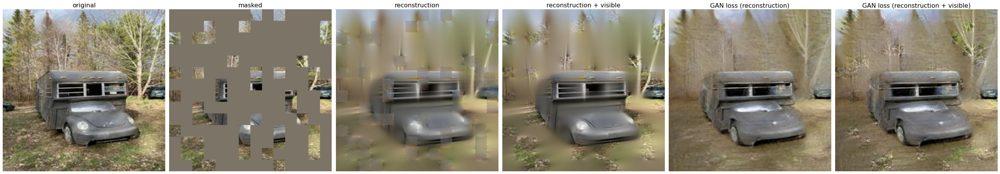

loading file: /home/siddiqui/Documents/interesting_pictures/taj_mahal.jpg
MAE with pixel reconstruction:


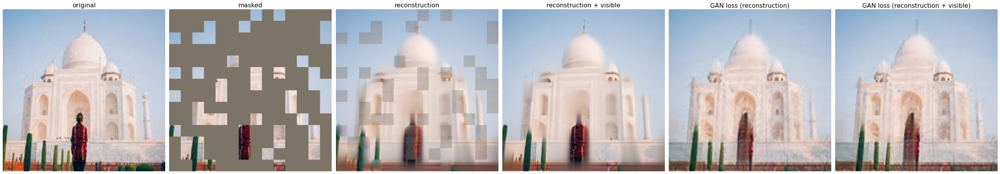

loading file: /home/siddiqui/Documents/interesting_pictures/whale.jpg
MAE with pixel reconstruction:


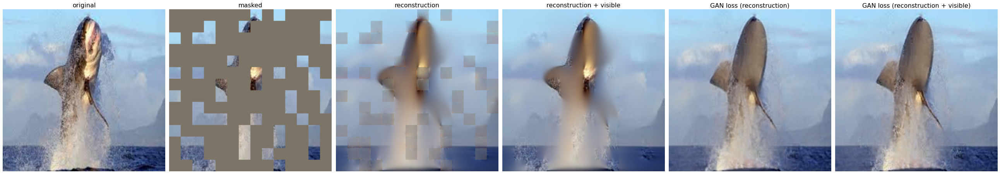

In [9]:
for i, file in enumerate(files):
    print("loading file:", file)
    # load an image
    img = Image.open(file)

    img = img.resize((224, 224))
    img = np.array(img) / 255.

    assert img.shape == (224, 224, 3)

    # normalize by ImageNet mean and std
    img = img - imagenet_mean
    img = img / imagenet_std

    torch.manual_seed(2)
    output_file = f"recons_{i+1}.jpg"
    print('MAE with pixel reconstruction:')
    run_one_image(img, model_mae, model_mae_gan, output_file)
    
    # torch.manual_seed(2)
    # output_file = f"recons_gan_{i+1}.jpg"
    # print('MAE with extra GAN loss:')
    # run_one_image(img, model_mae_gan, output_file)